# LIBRERIAS

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# CARGAR DATA

In [2]:
# Definir la lista para almacenar los datos
data = []
for i in range(1, 31):
    file_name = f"../datos/DATOSCLIENTE{i}.csv"  # Generar el nombre del archivo
    try:
        df = pd.read_csv(file_name)  # Cargar el archivo CSV como un DataFrame
        df['Cliente'] = f'Cliente {i}'  # Agregar la columna 'Cliente' con el nombre correspondiente
        data.append(df)  # Agregar el DataFrame a la lista
    except FileNotFoundError:
        print(f"El archivo {file_name} no se encontró.")

In [3]:
combined_df = pd.concat(data, ignore_index=True)
combined_df

,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,Cliente
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,Cliente 1
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,Cliente 1
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,Cliente 1
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,Cliente 1
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,Cliente 1
...,...,...,...,...,...,...
463420,2022-04-21 10:00:00,0.960105,0.473234,1273.150602,1027.084539,Cliente 30
463421,2022-04-21 11:00:00,0.624300,0.699936,1063.524968,1205.829819,Cliente 30
463422,2022-04-21 12:00:00,0.985633,0.123560,1207.284283,1127.893714,Cliente 30
463423,2022-04-21 13:00:00,0.710436,0.399262,1205.012971,1090.835898,Cliente 30


In [5]:
clientes_sector=pd.read_excel("../datos/sector_economico_clientes.xlsx")
clientes_sector.columns=["Cliente", "Sector Económico"]
clientes_sector['Cliente'] = clientes_sector['Cliente'].str.strip()
clientes_sector

,Cliente,Sector Económico
0,Cliente 1,Elaboración de cacao y chocolate y de producto...
1,Cliente 2,Elaboración de cacao y chocolate y de producto...
2,Cliente 3,Elaboración de cacao y chocolate y de producto...
3,Cliente 4,Elaboración de cacao y chocolate y de producto...
4,Cliente 5,Elaboración de cacao y chocolate y de producto...
5,Cliente 6,Cultivo de Árboles Frutales y Nueces
6,Cliente 7,Cultivo de Árboles Frutales y Nueces
7,Cliente 8,Cultivo de Árboles Frutales y Nueces
8,Cliente 9,Cultivo de Árboles Frutales y Nueces
9,Cliente 10,Cultivo de Árboles Frutales y Nueces


In [6]:
clientes_sector.groupby(["Sector Económico"]).count().reset_index().rename(columns={"Cliente":"Nro Clientes"})

,Sector Económico,Nro Clientes
0,"Captación, tratamiento y distribución de agua",5
1,Cultivo de Hortalizas,5
2,"Cultivo de hortalizas y melones, raíces y tubé...",1
3,Cultivo de otros frutos y nueces de árboles y ...,4
4,Cultivo de Árboles Frutales y Nueces,5
5,Elaboración de cacao y chocolate y de producto...,5
6,Venta al por mayor de metales y minerales meta...,5


In [7]:
merged_df = pd.merge(combined_df, clientes_sector, how="left")

In [8]:
merged_df

,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,Cliente,Sector Económico
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,Cliente 1,Elaboración de cacao y chocolate y de producto...
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,Cliente 1,Elaboración de cacao y chocolate y de producto...
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,Cliente 1,Elaboración de cacao y chocolate y de producto...
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,Cliente 1,Elaboración de cacao y chocolate y de producto...
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,Cliente 1,Elaboración de cacao y chocolate y de producto...
...,...,...,...,...,...,...,...
463420,2022-04-21 10:00:00,0.960105,0.473234,1273.150602,1027.084539,Cliente 30,Venta al por mayor de metales y minerales meta...
463421,2022-04-21 11:00:00,0.624300,0.699936,1063.524968,1205.829819,Cliente 30,Venta al por mayor de metales y minerales meta...
463422,2022-04-21 12:00:00,0.985633,0.123560,1207.284283,1127.893714,Cliente 30,Venta al por mayor de metales y minerales meta...
463423,2022-04-21 13:00:00,0.710436,0.399262,1205.012971,1090.835898,Cliente 30,Venta al por mayor de metales y minerales meta...


In [9]:
merged_df.pivot(columns="Cliente", index='Fecha', values='Active_energy').corr()['Cliente 10'].sort_values()

Cliente
Cliente 16   -0.267068
Cliente 14   -0.146653
Cliente 17   -0.107946
Cliente 30   -0.066720
Cliente 12   -0.066720
Cliente 26   -0.063312
Cliente 18   -0.052842
Cliente 1    -0.037635
Cliente 29    0.003512
Cliente 9     0.011439
Cliente 28    0.015587
Cliente 21    0.065509
Cliente 22    0.093726
Cliente 25    0.125625
Cliente 24    0.128395
Cliente 23    0.146050
Cliente 13    0.190124
Cliente 27    0.241251
Cliente 11    0.248447
Cliente 6     0.255709
Cliente 8     0.298336
Cliente 20    0.333774
Cliente 5     0.347187
Cliente 7     0.354155
Cliente 15    0.371675
Cliente 19    0.451976
Cliente 2     0.519749
Cliente 3     0.522303
Cliente 4     0.539435
Cliente 10    1.000000
Name: Cliente 10, dtype: float64

# CREACIÓN DE VARIABLES

In [10]:
import holidays
pe_holidays = holidays.PE()

In [11]:
merged_df['Fecha'] = pd.to_datetime(merged_df['Fecha'])
merged_df['año_mes'] = merged_df['Fecha'].dt.to_period('M').astype(str)
merged_df['año'] = merged_df['Fecha'].dt.year
merged_df['mes'] = merged_df['Fecha'].dt.month
merged_df['dia'] = merged_df['Fecha'].dt.day
merged_df['hora'] = merged_df['Fecha'].dt.hour
merged_df['dia_semana'] = merged_df['Fecha'].dt.day_name(locale = 'Spanish')
merged_df['dia_especial'] = merged_df['Fecha'].apply(lambda v: int(v in pe_holidays))

In [12]:
merged_df.head()

,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,Cliente,Sector Económico,año_mes,año,mes,dia,hora,dia_semana,dia_especial
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,Cliente 1,Elaboración de cacao y chocolate y de producto...,2021-01,2021,1,1,0,Viernes,1
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,Cliente 1,Elaboración de cacao y chocolate y de producto...,2021-01,2021,1,1,1,Viernes,1
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,Cliente 1,Elaboración de cacao y chocolate y de producto...,2021-01,2021,1,1,2,Viernes,1
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,Cliente 1,Elaboración de cacao y chocolate y de producto...,2021-01,2021,1,1,3,Viernes,1
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,Cliente 1,Elaboración de cacao y chocolate y de producto...,2021-01,2021,1,1,4,Viernes,1


# CALIDAD DE DATOS

In [13]:
merged_df.isna().sum()

Fecha               0
Active_energy       0
Reactive_energy     0
Voltaje_FA          0
Voltaje_FC          0
Cliente             0
Sector Económico    0
año_mes             0
año                 0
mes                 0
dia                 0
hora                0
dia_semana          0
dia_especial        0
dtype: int64

In [14]:
df_fechas = merged_df.groupby(["Cliente","Sector Económico"]).agg({"Fecha":["min","max"]}).reset_index()
df_fechas.columns = ["Cliente","Sector Económico","min","max"]
df_fechas.sort_values(by=["max","Sector Económico"])

,Cliente,Sector Económico,min,max
13,Cliente 21,Cultivo de Hortalizas,2021-01-01,2022-01-07 20:00:00
14,Cliente 22,Cultivo de Hortalizas,2021-01-01,2022-01-07 20:00:00
15,Cliente 23,Cultivo de Hortalizas,2021-01-01,2022-01-07 20:00:00
16,Cliente 24,Cultivo de Hortalizas,2021-01-01,2022-01-07 20:00:00
17,Cliente 25,Cultivo de Hortalizas,2021-01-01,2022-01-07 20:00:00
3,Cliente 12,Cultivo de otros frutos y nueces de árboles y ...,2021-01-01,2022-04-21 14:00:00
18,Cliente 26,Venta al por mayor de metales y minerales meta...,2021-01-01,2022-04-21 14:00:00
19,Cliente 27,Venta al por mayor de metales y minerales meta...,2021-01-01,2022-04-21 14:00:00
20,Cliente 28,Venta al por mayor de metales y minerales meta...,2021-01-01,2022-04-21 14:00:00
21,Cliente 29,Venta al por mayor de metales y minerales meta...,2021-01-01,2022-04-21 14:00:00


In [14]:
df_fechas.groupby("max")["Cliente"].count().reset_index().rename(columns={"max":"fecha_max","Cliente":"Nro Clientes"}).sort_values("fecha_max")

,fecha_max,Nro Clientes
0,2022-01-07 20:00:00,5
1,2022-04-21 14:00:00,6
2,2022-08-07 07:00:00,4
3,2023-03-24 11:00:00,5
4,2023-04-01 00:00:00,10


In [15]:
# Calcular el resumen de valores nulos o faltantes por variable
missing_values_summary = merged_df.isnull().sum()

print("Valores Nulos por Variable:")
print(missing_values_summary)

Valores Nulos por Variable:
Fecha               0
Active_energy       0
Reactive_energy     0
Voltaje_FA          0
Voltaje_FC          0
Cliente             0
Sector Económico    0
año_mes             0
año                 0
mes                 0
dia                 0
hora                0
dia_semana          0
dia_especial        0
dtype: int64


In [16]:
# Análisis descriptivo agrupado por 'Sector Económico'
selected_df = merged_df[['Active_energy', 'Reactive_energy', 'Voltaje_FA', 'Voltaje_FC', 'Cliente', 'Sector Económico']]
selected_df.groupby('Sector Económico').describe().T

Sector Económico       Captación, tratamiento y distribución de agua  \
Active_energy   count                                   97500.000000   
                mean                                        1.244150   
                std                                         1.576028   
                min                                        -1.329018   
                25%                                         0.303398   
                50%                                         0.562080   
                75%                                         0.852658   
                max                                         9.943944   
Reactive_energy count                                   97500.000000   
                mean                                        1.254853   
                std                                         1.302687   
                min                                         0.000042   
                25%                                         0.346231   
                50%                                         0.614692   
                75%                                         2.302004   
                max                                         9.514961   
Voltaje_FA      count                                   97500.000000   
                mean                                     2004.971168   
                std                                       137.607885   
                min                                      1606.752692   
                25%                                      1894.538223   
                50%                                      2021.706003   
                75%                                      2104.003489   
                max                                      2484.402599   
Voltaje_FC      count                                   97500.000000   
                mean                                     2001.797845   
                std                                       137.564995   
                min                                      1599.039306   
                25%                                      1890.766041   
                50%                                      2018.719038   
                75%                                      2100.612324   
                max                                      2448.645862   

Sector Económico       Cultivo de Hortalizas  \
Active_energy   count           44625.000000   
                mean                0.105204   
                std                 0.106830   
                min                 0.000000   
                25%                 0.025654   
                50%                 0.074116   
                75%                 0.158086   
                max                 0.814156   
Reactive_energy count           44625.000000   
                mean                0.126697   
                std                 0.113167   
                min                 0.000000   
                25%                 0.044000   
                50%                 0.101534   
                75%                 0.182528   
                max                 0.829292   
Voltaje_FA      count           44625.000000   
                mean             1928.073488   
                std               230.980992   
                min               897.503148   
                25%              1783.706581   
                50%              1934.147407   
                75%              2078.145200   
                max              2825.940801   
Voltaje_FC      count           44625.000000   
                mean             1927.493298   
                std               248.440718   
                min               909.553406   
                25%              1764.710222   
                50%              1933.471383   
                75%              2097.114207   
                max              2891.511189   

Sector Económico       Cultivo de hort

In [17]:
merged_df.groupby(["Cliente"])[["Active_energy", "Reactive_energy", "Voltaje_FA", "Voltaje_FC"]].min().sort_values("Active_energy")

,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC
Cliente,,,,
Cliente 18,-1.329018,0.000196,1797.065019,1753.874846
Cliente 20,-0.490206,0.000281,1856.752692,1849.039306
Cliente 17,-0.488248,0.000083,1694.589275,1666.510409
Cliente 22,0.000000,0.000000,1068.497165,997.305561
Cliente 30,0.000000,0.000000,536.771035,534.668425
Cliente 29,0.000000,0.000000,286.771035,284.668425
Cliente 12,0.000000,0.000000,536.771035,534.668425
Cliente 28,0.000000,0.000000,503.259267,481.669736
Cliente 27,0.000000,0.000000,456.496114,400.199523


In [18]:
merged_df.groupby(["Cliente"])[["Active_energy", "Reactive_energy", "Voltaje_FA", "Voltaje_FC"]].max().sort_values("Active_energy")

,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC
Cliente,,,,
Cliente 21,0.358380,0.375336,2359.156737,2486.612151
Cliente 24,0.445964,0.457545,2419.340195,2493.779596
Cliente 25,0.489633,0.540580,2669.340195,2743.779596
Cliente 22,0.542551,0.659381,2814.423414,2891.511189
Cliente 14,0.781830,0.584477,1955.986324,1958.343401
Cliente 23,0.814156,0.829292,2825.940801,2879.118460
Cliente 9,2.546763,2.357948,3754.051758,3681.262836
Cliente 29,2.731480,2.623734,1177.196947,1153.786722
Cliente 15,2.810176,1.473569,2205.986324,2208.343401


In [19]:
merged_df[merged_df['Active_energy'] < 0].groupby(["Cliente","Sector Económico"]).agg({"Fecha":["min","max"], 'Cliente':'count'}).reset_index()

Cliente                               Sector Económico  \
                                                               
0  Cliente 17  Captación, tratamiento y distribución de agua   
1  Cliente 18  Captación, tratamiento y distribución de agua   
2  Cliente 20  Captación, tratamiento y distribución de agua   

                Fecha                     Cliente  
                  min                 max   count  
0 2021-11-09 15:00:00 2021-11-11 16:00:00      34  
1 2022-01-23 00:00:00 2022-02-08 07:00:00     256  
2 2022-04-25 15:00:00 2022-05-09 16:00:00     215

In [20]:
neg_cliente_17 = merged_df.query("Cliente == 'Cliente 17' and Fecha >= '2021-11-09 15:00:00' and Fecha <= '2021-11-11 16:00:00'").copy()
sum(neg_cliente_17['Active_energy'] < 0)/ len(neg_cliente_17)

0.68

In [21]:
neg_cliente18 = merged_df.query("Cliente == 'Cliente 18' and Fecha >= '2022-01-23 00:00:00' and Fecha <= '2022-02-08 07:00:00'").copy()
sum(neg_cliente18['Active_energy'] < 0)/ len(neg_cliente18)

0.6530612244897959

In [22]:
neg_cliente20 = merged_df.query("Cliente == 'Cliente 20' and Fecha >= '2022-04-25 15:00:00' and Fecha <= '2022-05-09 16:00:00'").copy()
sum(neg_cliente20['Active_energy'] < 0)/ len(neg_cliente20)

0.636094674556213

In [23]:
neg_cliente_17['neg'] = (neg_cliente_17['Active_energy'] < 0).astype(int)
neg_cliente_17.groupby(['hora'])['neg'].value_counts()

hora  neg
0     1      2
1     1      2
2     1      2
3     1      2
4     1      2
5     1      2
6     1      2
7     1      2
8     1      2
9     1      2
10    1      2
11    1      2
12    0      1
      1      1
13    1      2
14    0      1
      1      1
15    1      3
16    1      3
17    0      2
18    0      2
19    0      2
20    0      2
21    0      2
22    0      2
23    0      2
Name: neg, dtype: int64

In [24]:
neg_cliente18['neg'] = (neg_cliente18['Active_energy'] < 0).astype(int)
neg_cliente18.groupby(['hora'])['neg'].value_counts()

hora  neg
0     1      16
      0       1
1     1      17
2     1      15
      0       2
3     1      17
4     1      15
      0       2
5     1      15
      0       2
6     1      14
      0       3
7     1      17
8     1      15
      0       1
9     1      13
      0       3
10    1      12
      0       4
11    1      15
      0       1
12    1      12
      0       4
13    1      13
      0       3
14    1      11
      0       5
15    1      13
      0       3
16    1      14
      0       2
17    0       9
      1       7
18    0      16
19    0      16
20    0      16
21    0      16
22    0      16
23    0      11
      1       5
Name: neg, dtype: int64

In [25]:
neg_cliente20['neg'] = (neg_cliente20['Active_energy'] < 0).astype(int)
neg_cliente20.groupby(['hora'])['neg'].value_counts()

hora  neg
0     1      14
1     1      14
2     1      14
3     1      14
4     1      14
5     1      14
6     1      14
7     1      14
8     1      14
9     1      14
10    1      14
11    1      14
12    1      14
13    0      12
      1       2
14    0      11
      1       3
15    1      13
      0       2
16    1      15
17    0      14
18    0      14
19    0      14
20    0      14
21    0      14
22    0      14
23    0      14
Name: neg, dtype: int64

# DESCRIPTIVOS

In [26]:
data_columns = ["Active_energy", "Reactive_energy", "Voltaje_FA", "Voltaje_FC"]

In [27]:
merged_df[data_columns].describe()

,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC
count,463425.000000,463425.000000,463425.000000,463425.000000
mean,1.472050,0.873086,1420.188470,1438.515836
std,1.718780,1.158846,766.299118,746.447449
min,-1.329018,0.000000,0.031000,0.031000
25%,0.242788,0.112832,719.462874,748.148254
50%,0.810771,0.380650,1625.493463,1634.696089
75%,1.992488,1.222834,2037.276385,2040.554497
max,14.622644,11.135141,4266.229746,4399.038932


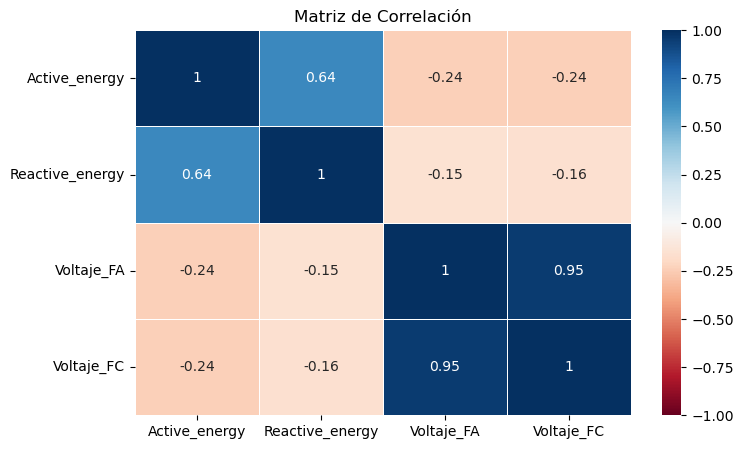

In [28]:
# Seleccionar solo las variables numéricas para la matriz de correlación
numeric_vars = merged_df[data_columns].select_dtypes(include=['int', 'float'])

# Calcular la matriz de correlación
correlation_matrix = numeric_vars.corr()

# Crear un mapa de calor para visualizar la matriz de correlación
plt.figure(figsize=(8, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu', linewidths=0.5, vmin=-1)
plt.title('Matriz de Correlación')
plt.show()


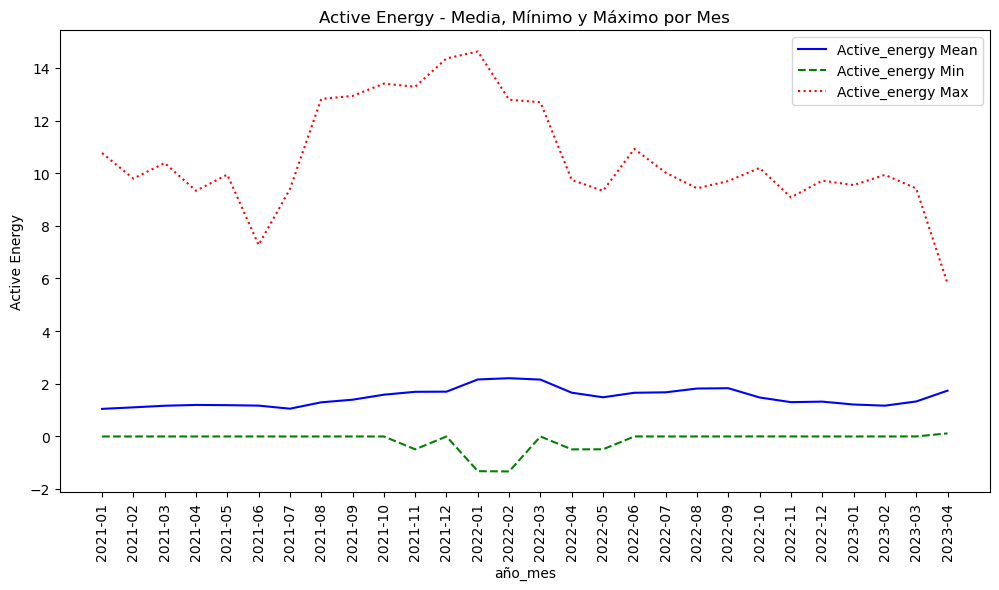

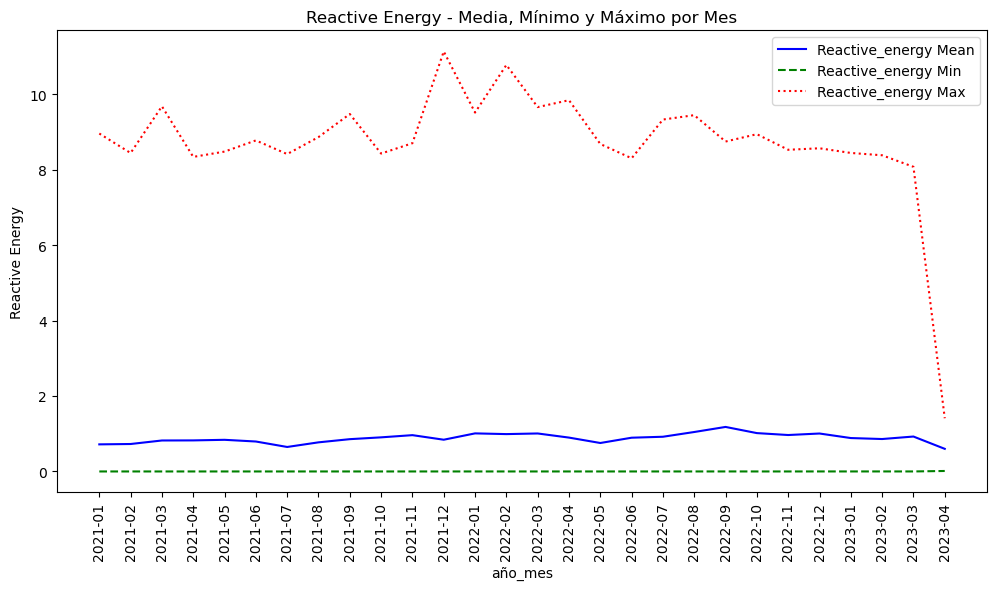

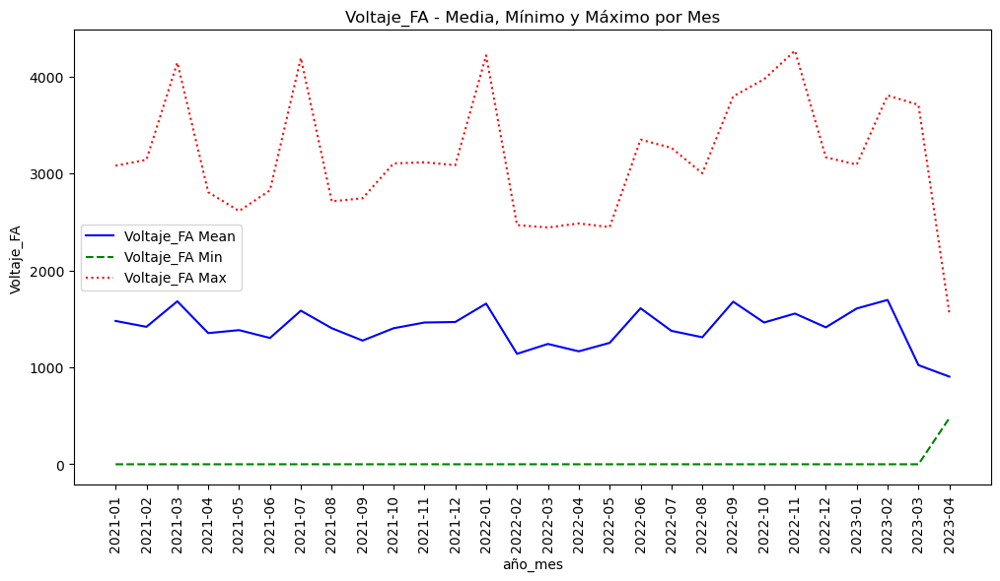

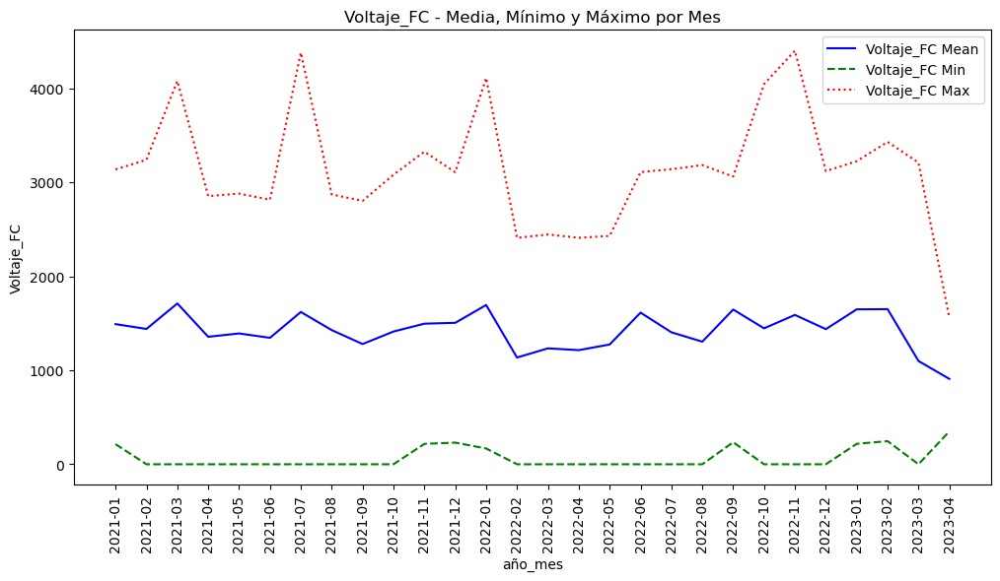

In [29]:
#ANALISIS POR MESES
grouped_data = merged_df.groupby('año_mes').agg({'Active_energy': ['mean', 'min', 'max'],
                                            'Reactive_energy': ['mean', 'min', 'max'],
                                            'Voltaje_FA': ['mean', 'min', 'max'],
                                            'Voltaje_FC': ['mean', 'min', 'max']})

# Gráficos de líneas para media, min y max por mes
plt.figure(figsize=(12, 6))
plt.plot(grouped_data.index, grouped_data[('Active_energy', 'mean')], label='Active_energy Mean', color='b')
plt.plot(grouped_data.index, grouped_data[('Active_energy', 'min')], label='Active_energy Min', color='g', linestyle='dashed')
plt.plot(grouped_data.index, grouped_data[('Active_energy', 'max')], label='Active_energy Max', color='r', linestyle='dotted')
plt.xlabel('año_mes')
plt.ylabel('Active Energy')
plt.title('Active Energy - Media, Mínimo y Máximo por Mes')
plt.legend()
plt.xticks(rotation=90)  # Rotar los valores del eje x
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(grouped_data.index, grouped_data[('Reactive_energy', 'mean')], label='Reactive_energy Mean', color='b')
plt.plot(grouped_data.index, grouped_data[('Reactive_energy', 'min')], label='Reactive_energy Min', color='g', linestyle='dashed')
plt.plot(grouped_data.index, grouped_data[('Reactive_energy', 'max')], label='Reactive_energy Max', color='r', linestyle='dotted')
plt.xlabel('año_mes')
plt.ylabel('Reactive Energy')
plt.title('Reactive Energy - Media, Mínimo y Máximo por Mes')
plt.legend()
plt.xticks(rotation=90)  # Rotar los valores del eje x
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(grouped_data.index, grouped_data[('Voltaje_FA', 'mean')], label='Voltaje_FA Mean', color='b')
plt.plot(grouped_data.index, grouped_data[('Voltaje_FA', 'min')], label='Voltaje_FA Min', color='g', linestyle='dashed')
plt.plot(grouped_data.index, grouped_data[('Voltaje_FA', 'max')], label='Voltaje_FA Max', color='r', linestyle='dotted')
plt.xlabel('año_mes')
plt.ylabel('Voltaje_FA')
plt.title('Voltaje_FA - Media, Mínimo y Máximo por Mes')
plt.legend()
plt.xticks(rotation=90)  # Rotar los valores del eje x
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(grouped_data.index, grouped_data[('Voltaje_FC', 'mean')], label='Voltaje_FC Mean', color='b')
plt.plot(grouped_data.index, grouped_data[('Voltaje_FC', 'min')], label='Voltaje_FC Min', color='g', linestyle='dashed')
plt.plot(grouped_data.index, grouped_data[('Voltaje_FC', 'max')], label='Voltaje_FC Max', color='r', linestyle='dotted')
plt.xlabel('año_mes')
plt.ylabel('Voltaje_FC')
plt.title('Voltaje_FC - Media, Mínimo y Máximo por Mes')
plt.legend()
plt.xticks(rotation=90)  # Rotar los valores del eje x

plt.show()

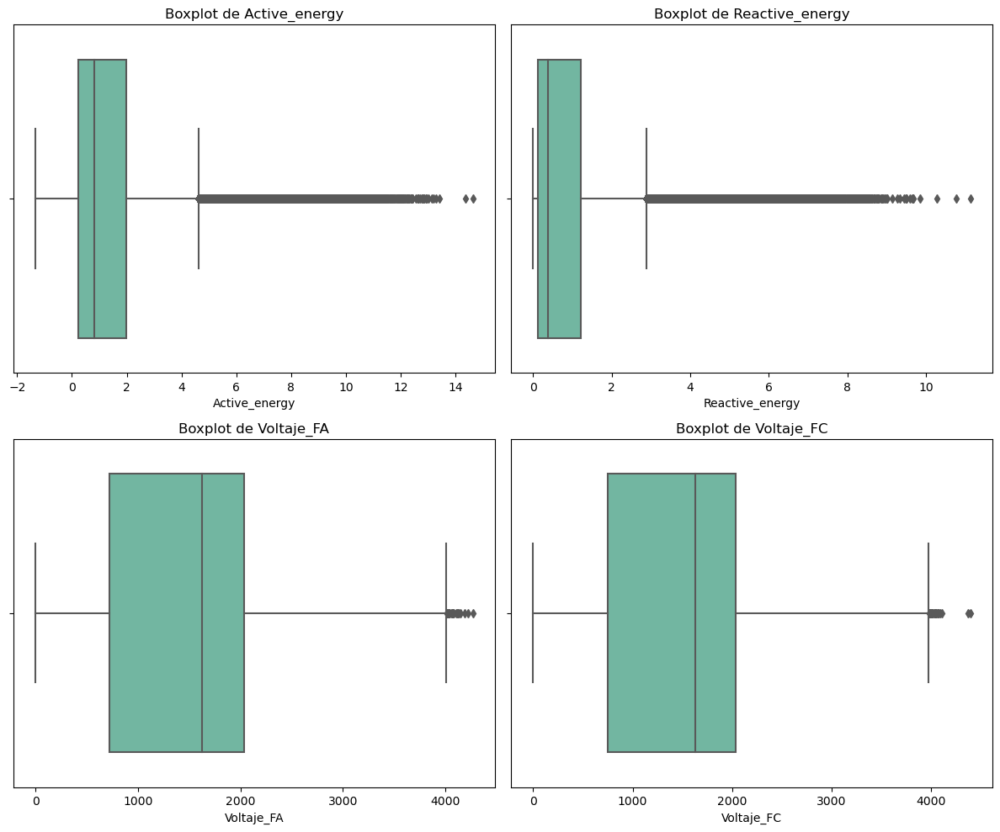

In [30]:
#BOXPLOT
# Crear gráficos independientes de 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Iterar sobre las variables y trazar los boxplots
for i, (col, ax) in enumerate(zip(numeric_vars.columns, axes.flatten())):
    sns.boxplot(x=numeric_vars[col], ax=ax, palette='Set2')
    ax.set_title(f'Boxplot de {col}')
    ax.set_xlabel(col)

plt.tight_layout()
plt.show()

In [31]:
merged_df['Sector Económico'].unique()        

array(['Elaboración de cacao y chocolate y de productos de confitería',
       'Cultivo de Árboles Frutales y Nueces',
       'Cultivo de otros frutos y nueces de árboles y arbustos',
       'Cultivo de hortalizas y melones, raíces y tubérculos',
       'Captación, tratamiento y distribución de agua',
       'Cultivo de Hortalizas',
       'Venta al por mayor de metales y minerales metalíferos'],
      dtype=object)

### Análisis consumo por sector

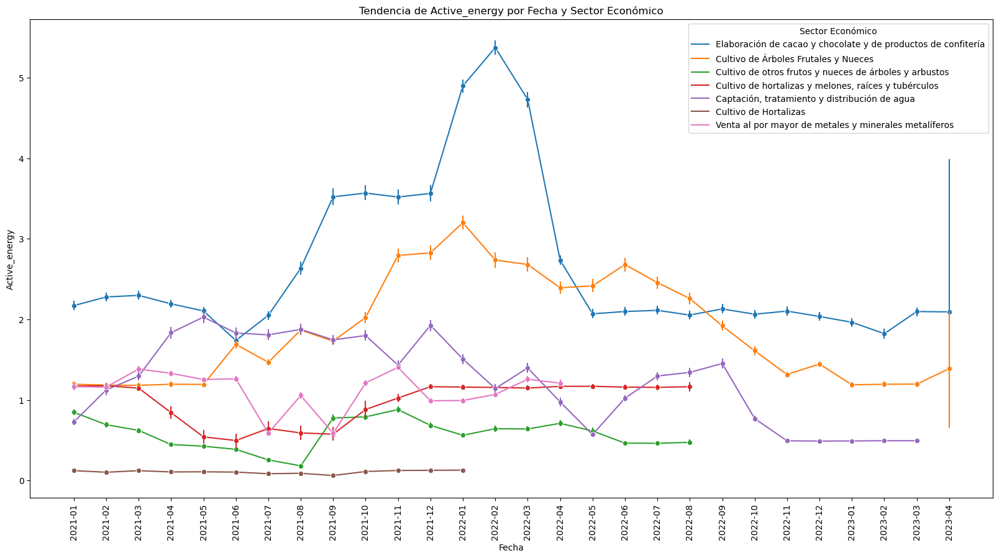

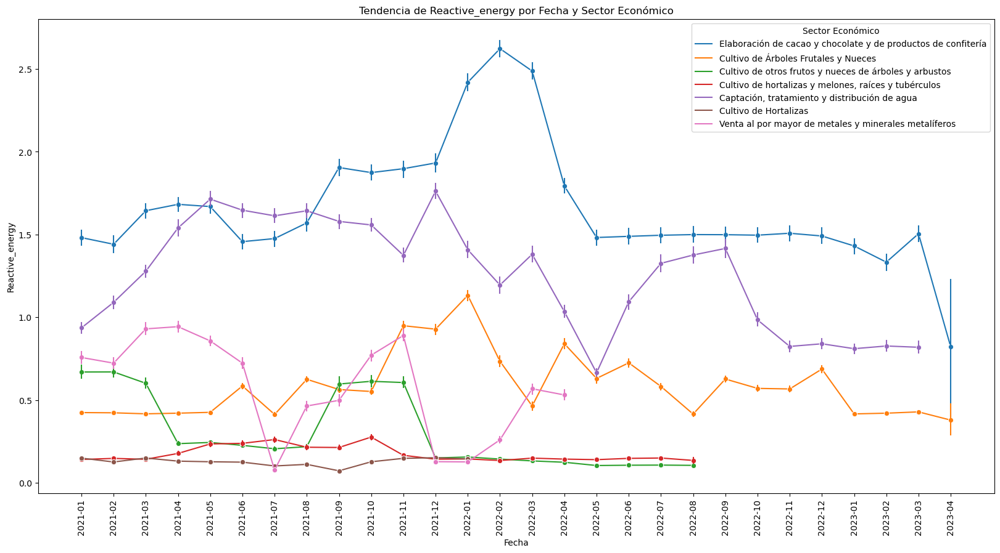

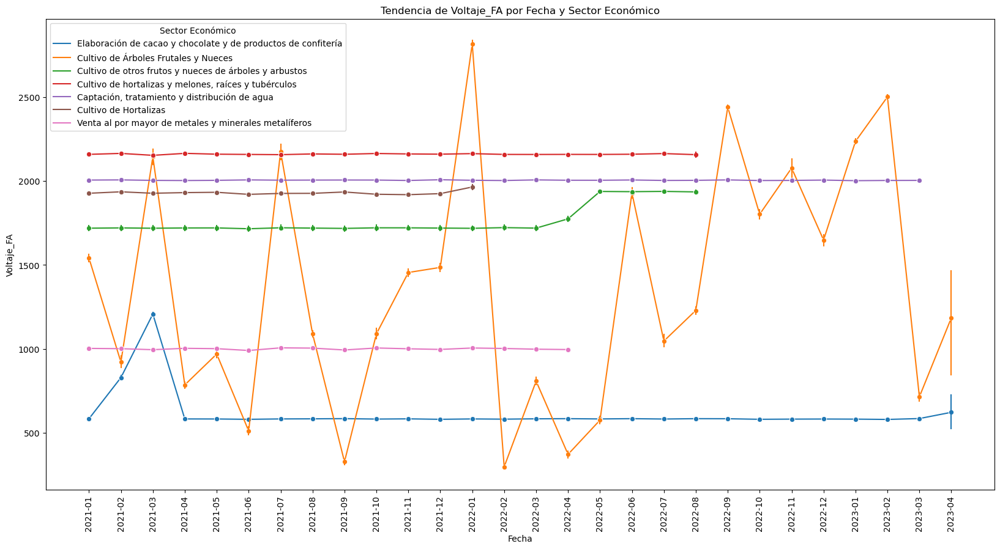

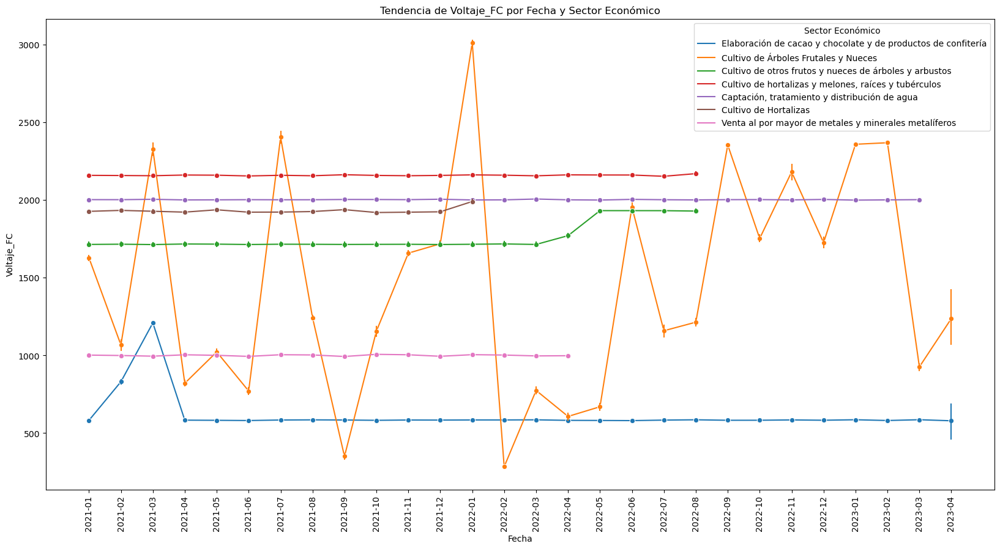

In [32]:
#GRAFICAS POR MES , VARIABLES Y POR SECTORES
numeric_columns = merged_df[["Active_energy", "Reactive_energy", "Voltaje_FA", "Voltaje_FC"]].select_dtypes(include=['int', 'float']).columns

# Crear gráficos de línea por cada variable numérica
for col in numeric_columns:
    plt.figure(figsize=(20,10))
    sns.lineplot(data=merged_df, x='año_mes', y=col, hue='Sector Económico', marker='o', err_style='bars')
    plt.title(f'Tendencia de {col} por Fecha y Sector Económico')
    plt.xlabel('Fecha')
    plt.ylabel(col)
    plt.xticks(rotation=90)  # Rotar los valores del eje x
    plt.show()

Se identifica que para cada sector los patrones de consumo son muy diferentes. Llama la atención que específicamente para el sector de Cultivo de Árboles Frutales y Nueces el comportamiento del voltaje es muy variable en el tiempo, mientras que para el resto no.

#### Creación de nuevas variables

In [33]:
merged_df['Active_vs_Reactive'] = merged_df["Active_energy"]-merged_df["Reactive_energy"]
merged_df['Active_vs_VoltajeFA'] = merged_df["Active_energy"]/merged_df["Voltaje_FA"]
merged_df['Active_vs_VoltajeFC'] = merged_df["Active_energy"]/merged_df["Voltaje_FC"]
merged_df['Reactive_vs_VoltajeFA'] = merged_df["Reactive_energy"]/merged_df["Voltaje_FA"]
merged_df['Reactive_vs_VoltajeFC'] = merged_df["Reactive_energy"]/merged_df["Voltaje_FC"]
merged_df['VoltajeFA_vs_VoltajeFC'] = merged_df["Voltaje_FA"]/merged_df["Voltaje_FC"]

In [48]:
df_cliente = df_cliente.set_index("Fecha")

### Análisis detallados por sector y clientes

In [62]:
def analisis_detallado(df_cliente, tipo="cliente", desc=""):
    df_cliente = df_cliente.set_index("Fecha")
    
    fig, axs = plt.subplots(1,2, figsize=(8, 4))
    sns.kdeplot(data=df_cliente[["Active_energy", "Reactive_energy"]], ax=axs[0])
    sns.kdeplot(data=df_cliente[["Voltaje_FA", "Voltaje_FC"]], ax=axs[1])
    axs[0].set_title('Distribución energía')
    axs[1].set_title('Distribución voltaje')
    axs[1].set_ylabel('')
    fig.suptitle("Comparativo de distribución de energía y voltaje " + desc)    
    plt.show()

    grid = df_cliente[data_columns].plot(marker='.',alpha=0.4, linestyle='None', figsize=(16, 6), subplots=True)
    for ax in grid:
        for fecha in list(df_cliente.resample('M')['dia_especial'].max().reset_index().query("dia_especial == 1")['Fecha']):
            ax.axvline(fecha,0,25, color="lightgray")
    plt.suptitle("Comparativo de distribución de energía y voltaje " + desc)       
    plt.show()

    df_cliente[data_columns][(df_cliente["año"] == 2021) & (df_cliente["mes"]==3)].plot(marker='.',alpha=0.4, linestyle='None', figsize=(16, 6), subplots=True)
    plt.suptitle("Distribución de los datos a lo largo del tiempo para marzo 2021 " + desc)       
    plt.show()

    vs_cols = ['Active_vs_Reactive','Active_vs_VoltajeFA','Active_vs_VoltajeFC','Reactive_vs_VoltajeFA','Reactive_vs_VoltajeFC','VoltajeFA_vs_VoltajeFC']
    grid = df_cliente[vs_cols].plot(marker='.',alpha=0.4, linestyle='None', figsize=(16, 6), subplots=True)
    for ax in grid:
        for fecha in list(df_cliente.resample('M')['dia_especial'].max().reset_index().query("dia_especial == 1")['Fecha']):
            ax.axvline(fecha,0,25, color="lightgray")
    plt.suptitle("Comparación entre variables - Distribución de los datos a lo largo del tiempo " + desc)                   
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(9, 5))
    sns.boxplot(data=df_cliente, x='mes', y='Active_energy', ax=axs[0], showfliers=False)
    axs[0].set_title('Active_energy')
    axs[0].set_ylabel('Active_energy')
    sns.boxplot(data=df_cliente, x='mes', y='Reactive_energy', ax=axs[1], showfliers=False)
    axs[1].set_title('Reactive_energy')
    axs[1].set_ylabel('Reactive_energy')
    plt.suptitle("Distribución energía por mes " + desc)
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(9, 5))
    sns.boxplot(data=df_cliente, x='mes', y='Voltaje_FA', ax=axs[0], showfliers=False)
    axs[0].set_title('Voltaje_FA')
    axs[0].set_ylabel('Voltaje_FA')
    sns.boxplot(data=df_cliente, x='mes', y='Voltaje_FC', ax=axs[1], showfliers=False)
    axs[1].set_title('Voltaje_FC')
    axs[1].set_ylabel('Voltaje_FC')
    plt.suptitle("Distribución voltaje por mes " + desc)
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(13, 5))
    sns.boxplot(data=df_cliente, x='dia', y='Active_energy', ax=axs[0], showfliers=False)
    axs[0].set_title('Active_energy')
    axs[0].set_ylabel('Active_energy')
    sns.boxplot(data=df_cliente, x='dia', y='Reactive_energy', ax=axs[1], showfliers=False)
    axs[1].set_title('Reactive_energy')
    axs[1].set_ylabel('Reactive_energy')
    plt.suptitle("Distribución energía por dia " + desc)
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(13, 5))
    sns.boxplot(data=df_cliente, x='dia', y='Voltaje_FA', ax=axs[0], showfliers=False)
    axs[0].set_title('Voltaje_FA')
    axs[0].set_ylabel('Voltaje_FA')
    sns.boxplot(data=df_cliente, x='dia', y='Voltaje_FC', ax=axs[1], showfliers=False)
    axs[1].set_title('Voltaje_FC')
    axs[1].set_ylabel('Voltaje_FC')
    plt.suptitle("Distribución voltaje por dia " + desc)
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(11, 5))
    sns.boxplot(data=df_cliente, x='dia_semana', y='Active_energy', ax=axs[0], order=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'], showfliers=False)
    axs[0].set_title('Active_energy')
    axs[0].set_ylabel('Active_energy')
    sns.boxplot(data=df_cliente, x='dia_semana', y='Reactive_energy', ax=axs[1], order=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'], showfliers=False)
    axs[1].set_title('Reactive_energy')
    axs[1].set_ylabel('Reactive_energy')
    plt.suptitle("Distribución energía por día de la semana " + desc)
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(11, 5))
    sns.boxplot(data=df_cliente, x='dia_semana', y='Voltaje_FA', ax=axs[0], order=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'], showfliers=False)
    axs[0].set_title('Voltaje_FA')
    axs[0].set_ylabel('Voltaje_FA')
    sns.boxplot(data=df_cliente, x='dia_semana', y='Voltaje_FC', ax=axs[1], order=['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'], showfliers=False)
    axs[1].set_title('Voltaje_FC')
    axs[1].set_ylabel('Voltaje_FC')
    plt.suptitle("Distribución voltaje por día de la semana " + desc)
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(13, 5))
    sns.boxplot(data=df_cliente, x='hora', y='Active_energy', ax=axs[0], showfliers=False)
    axs[0].set_title('Active_energy')
    axs[0].set_ylabel('Active_energy')
    sns.boxplot(data=df_cliente, x='hora', y='Reactive_energy', ax=axs[1], showfliers=False)
    axs[1].set_title('Reactive_energy')    
    axs[1].set_ylabel('Reactive_energy')
    plt.suptitle("Distribución energía por hora " + desc)
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(13, 5))
    sns.boxplot(data=df_cliente, x='hora', y='Voltaje_FA', ax=axs[0], showfliers=False)
    axs[0].set_title('Voltaje_FA')
    axs[0].set_ylabel('Voltaje_FA')
    sns.boxplot(data=df_cliente, x='hora', y='Voltaje_FC', ax=axs[1], showfliers=False)
    axs[1].set_title('Voltaje_FC')
    axs[1].set_ylabel('Voltaje_FC')
    plt.suptitle("Distribución voltaje por hora " + desc)
    plt.show()

    df_cliente_w = df_cliente[["Active_energy", "Reactive_energy", "Voltaje_FA", "Voltaje_FC"]].resample('W').sum()
    fig, axs = plt.subplots(1,2, figsize=(12, 5))
    sns.lineplot(data=df_cliente_w, x='Fecha', y='Active_energy', ax=axs[0])
    axs[0].set_title('Active_energy')
    axs[0].set_ylabel('Active_energy')    
    axs[0].tick_params(axis='x', rotation=45)
    sns.lineplot(data=df_cliente_w, x='Fecha', y='Reactive_energy', ax=axs[1])
    axs[1].set_title('Reactive_energy')
    axs[1].set_ylabel('Reactive_energy')
    axs[1].tick_params(axis='x', rotation=45)
    plt.suptitle("Serie temporal semanal consumo de energía " + desc)
    plt.show()

    fig, axs = plt.subplots(1,2, figsize=(13, 5))
    sns.lineplot(data=df_cliente_w, x='Fecha', y='Voltaje_FA', ax=axs[0])
    axs[0].set_title('Voltaje_FA')
    axs[0].set_ylabel('Voltaje_FA')    
    axs[0].tick_params(axis='x', rotation=45)
    sns.lineplot(data=df_cliente_w, x='Fecha', y='Voltaje_FC', ax=axs[1])
    axs[1].set_title('Voltaje_FC')
    axs[1].set_ylabel('Voltaje_FC')
    axs[1].tick_params(axis='x', rotation=45)
    plt.suptitle("Serie temporal semanal voltaje" + desc)
    plt.show()

    if tipo == "cliente":
        decompose = seasonal_decompose(df_cliente['Active_energy'],model='additive')
        fig = decompose.plot()
        fig.set_size_inches((16, 9))
        fig.suptitle("Descomposición serie Active_energy " + desc)
        plt.show()

        print("Descomposición serie Reactive_energy")
        decompose = seasonal_decompose(df_cliente['Reactive_energy'],model='additive')
        fig = decompose.plot()
        fig.set_size_inches((16, 9))
        fig.suptitle("Descomposición serie Reactive_energy " + desc)        
        plt.show()

        print("Descomposición serie Voltaje_FA")
        decompose = seasonal_decompose(df_cliente['Voltaje_FA'],model='additive')
        fig = decompose.plot()
        fig.set_size_inches((16, 9))
        fig.suptitle("Descomposición serie Voltaje_FA " + desc)                
        plt.show()   

        print("Descomposición serie Voltaje_FC")
        decompose = seasonal_decompose(df_cliente['Voltaje_FC'],model='additive')
        fig = decompose.plot()
        fig.set_size_inches((16, 9))
        fig.suptitle("Descomposición serie Voltaje_FC " + desc)                
        plt.show()        

    print("\n\n")

## Análisis por sector

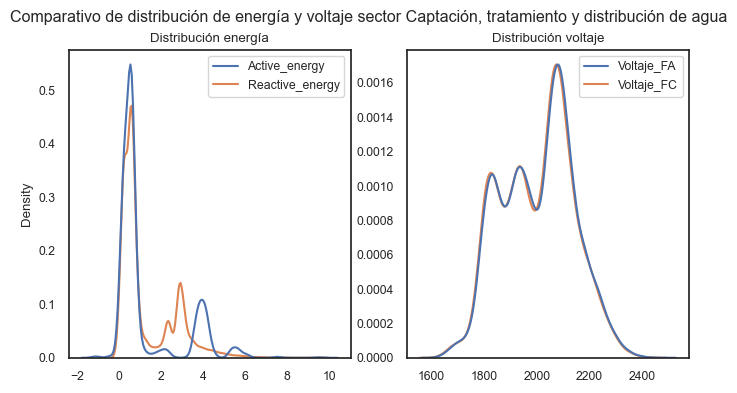

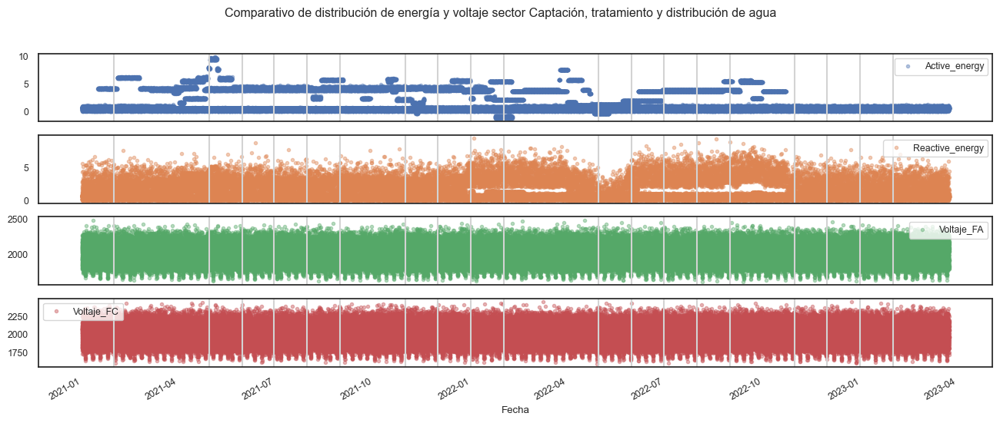

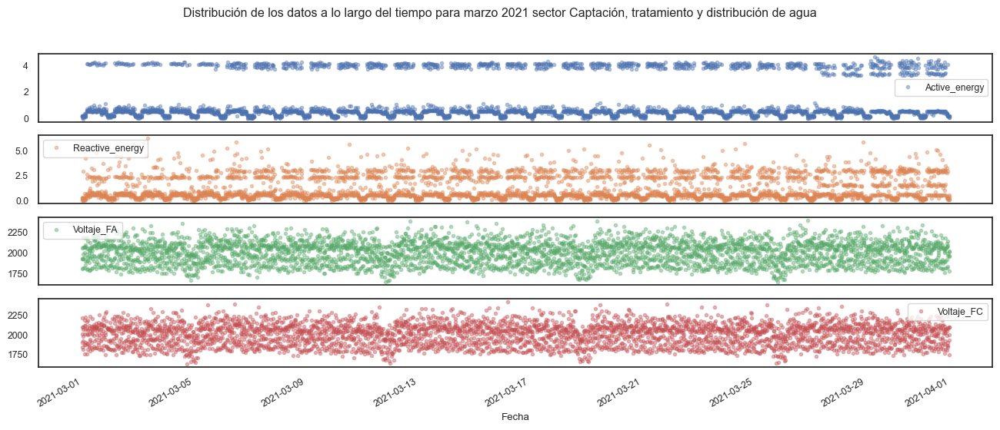

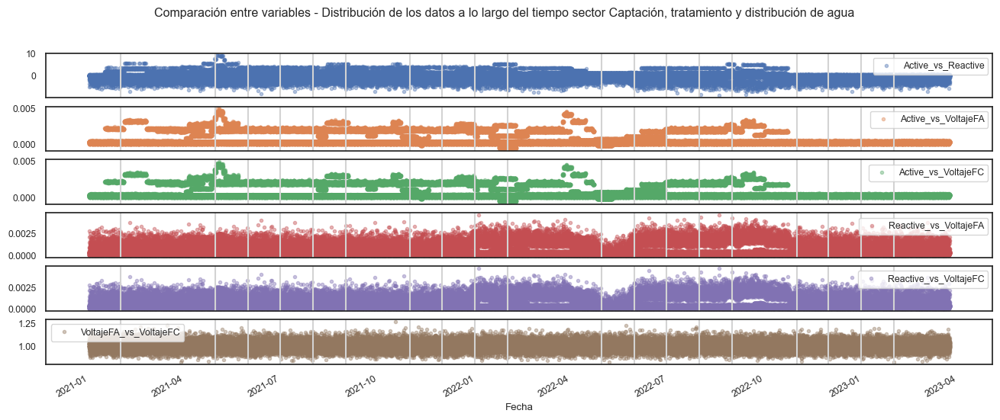

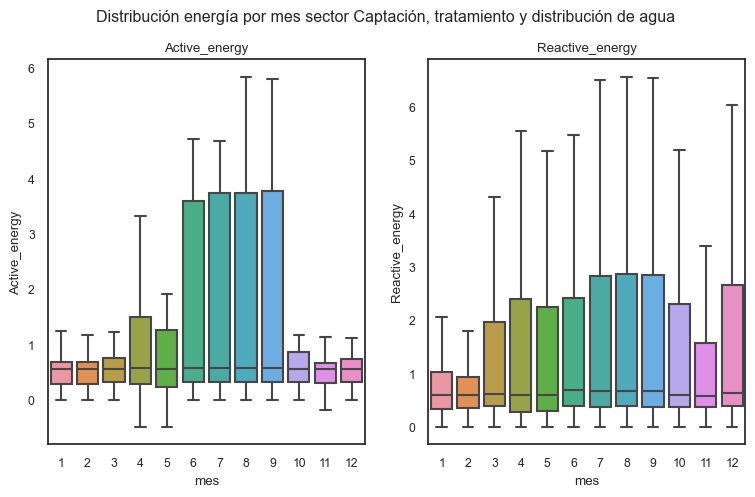

...

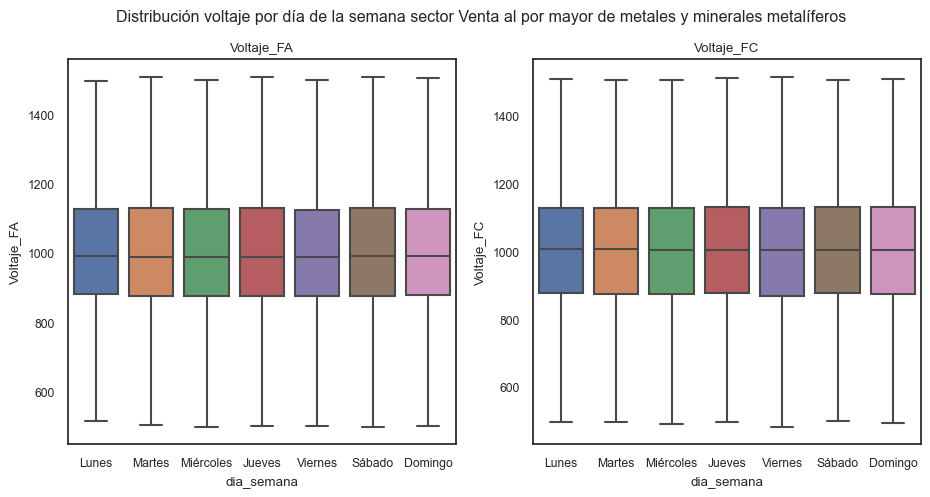

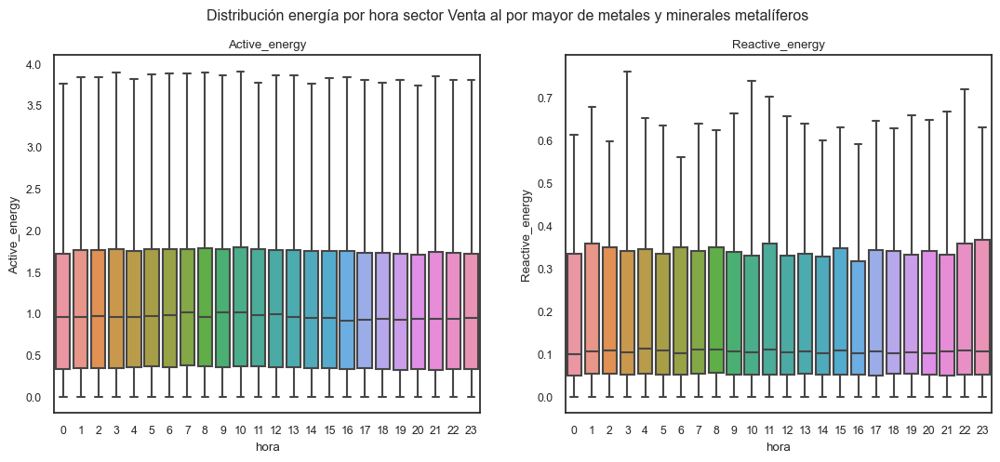

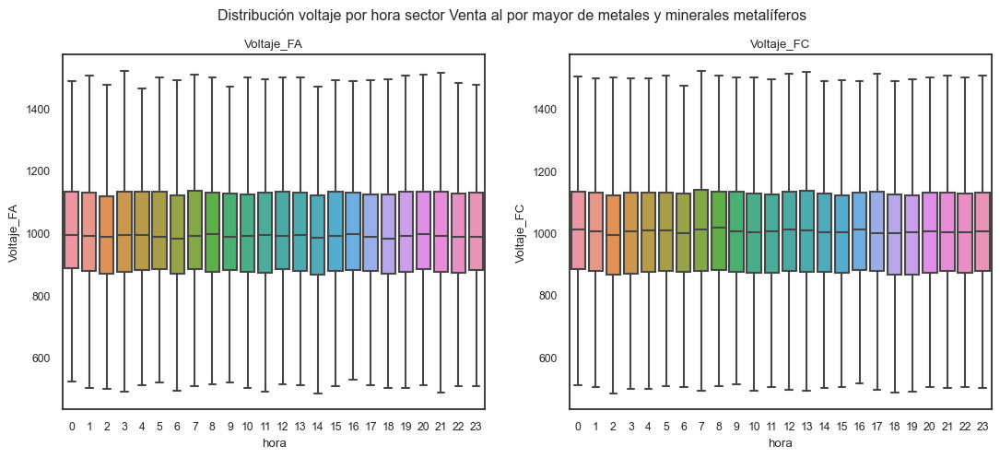

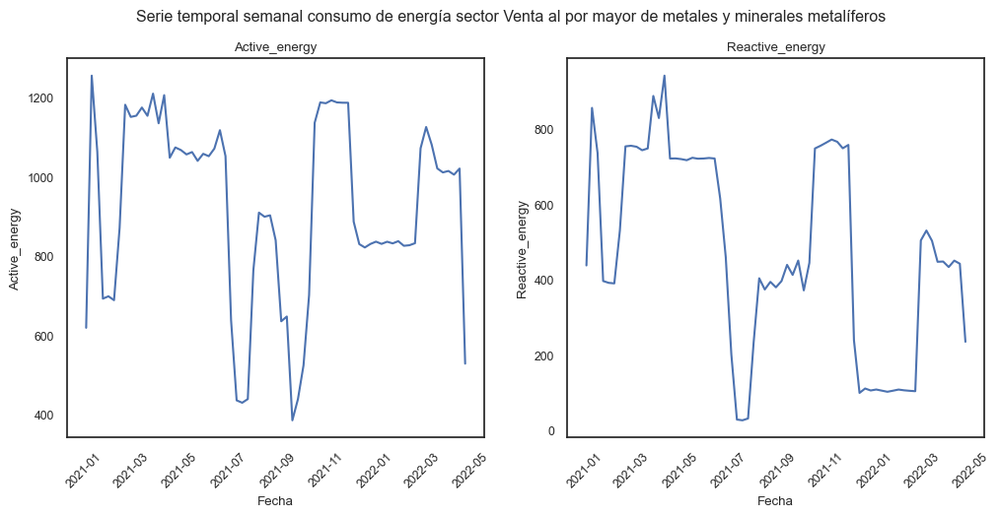

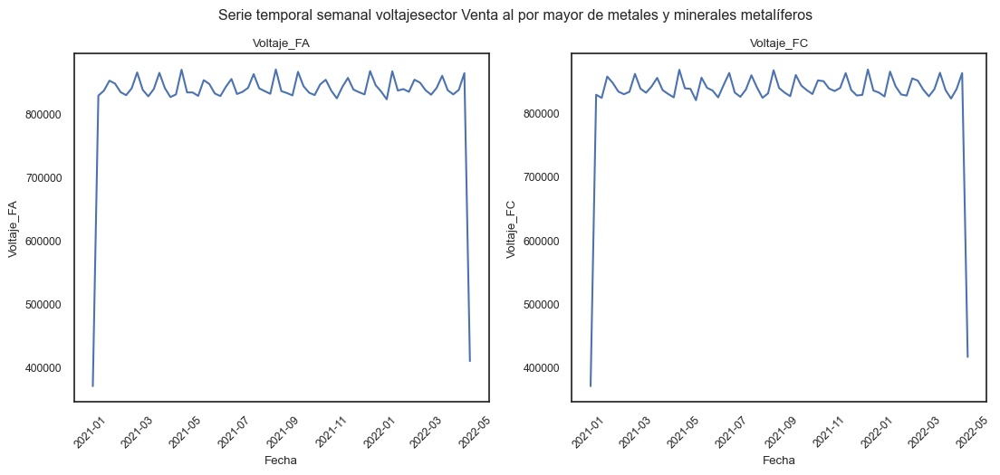

In [63]:
from IPython.display import display, HTML
from statsmodels.tsa.seasonal import seasonal_decompose

sns.set(font_scale=0.8)
sns.set_style("white")

for sector in sorted(list(set(merged_df['Sector Económico']))):
    display(HTML(f"<h2>Análisis sector {sector}</h2>"))
    df_sector = merged_df[merged_df['Sector Económico'] == sector]

    analisis_detallado(df_sector, tipo="sector", desc=f"sector {sector}")

 ### Análisis de puntos de cambio por cliente

In [45]:
import ruptures as rpt
import numpy as np
import ruptures as rpt

def plot_change_points_ruptures(df, ts, ts_change_all, title):
    
    plt.figure(figsize=(16,4))
    plt.plot(df.index, ts)
    for x in [df.iloc[idx-1].name for idx in ts_change_all]:
        plt.axvline(x, lw=2, color='red')

    plt.title(title)
    plt.show()

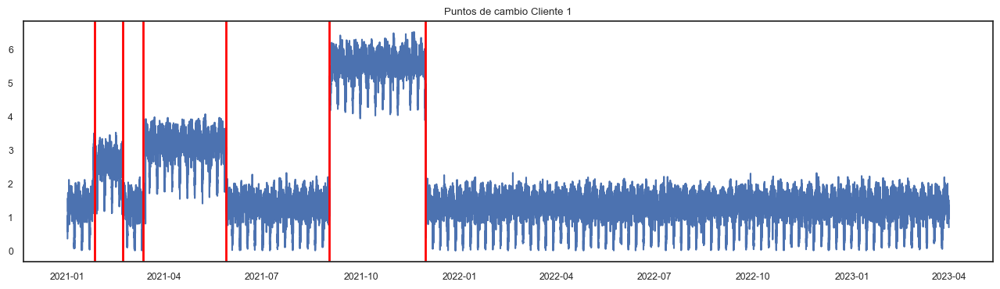

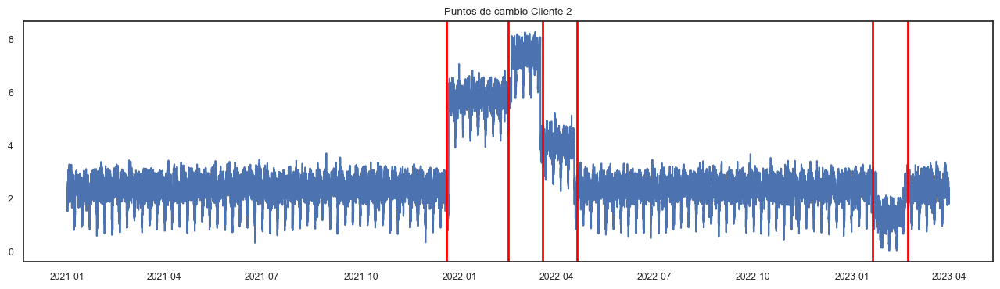

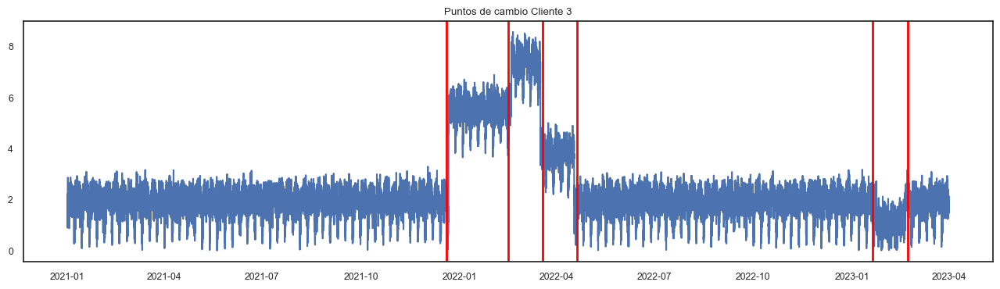

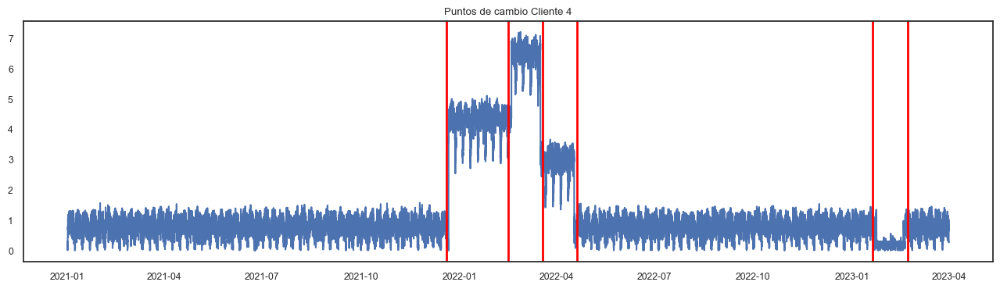

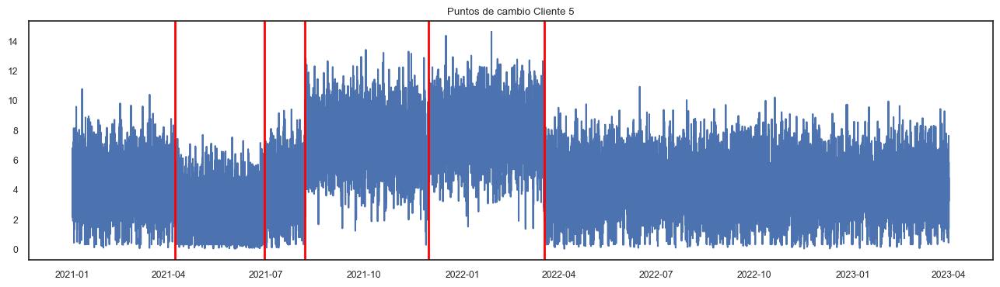

...

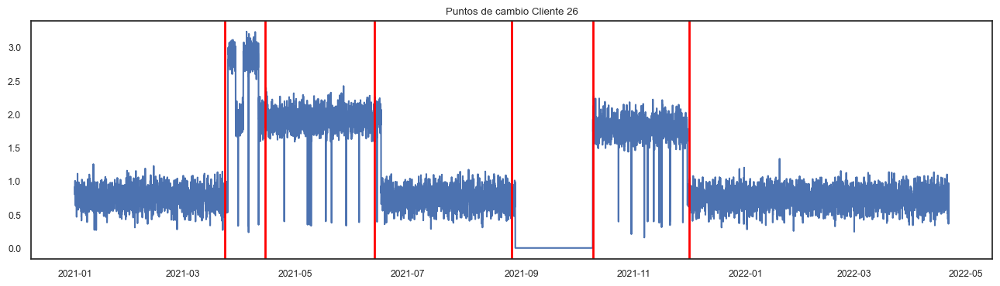

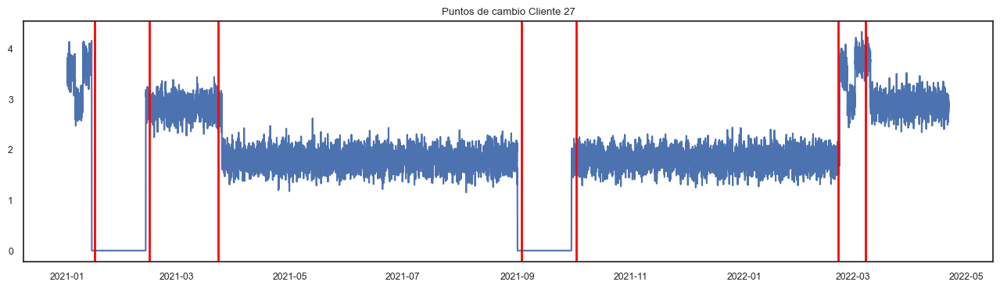

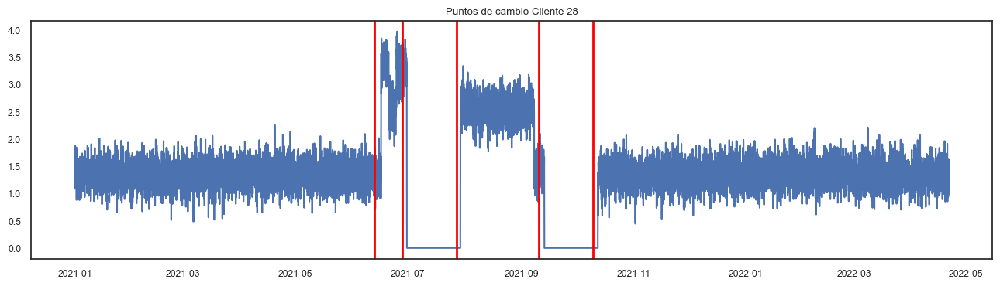

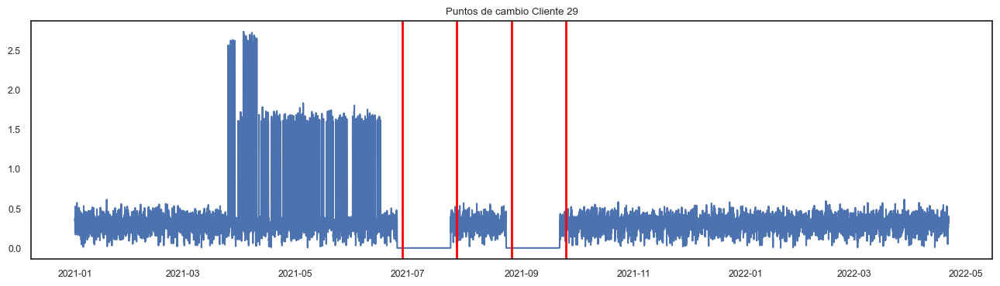

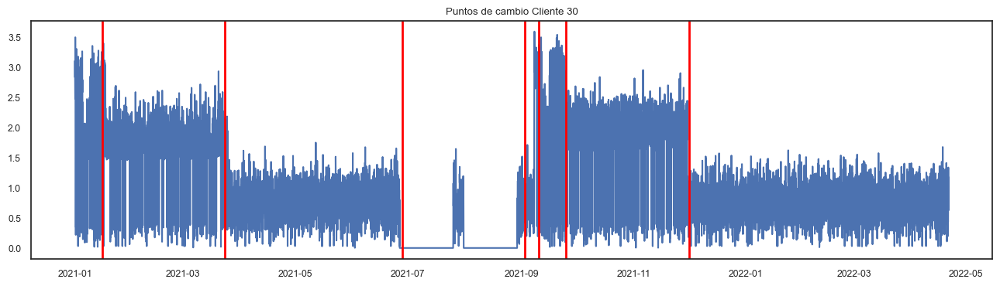

In [46]:
clientes = merged_df['Cliente'].unique()
for cliente in clientes:
    df_cliente = merged_df[merged_df['Cliente'] == cliente]
    df_cliente = df_cliente.set_index("Fecha")

    tsd = np.array(df_cliente['Active_energy'])
    detector = rpt.BottomUp(model="l1", min_size=120).fit(tsd)
    change_points = detector.predict(pen=20)
    plot_change_points_ruptures(df_cliente[['Active_energy']], tsd, change_points[:-1], 'Puntos de cambio {}'.format(cliente))    

## Análisis detallado de los clientes que presentan puntos de cambio que llaman la atención

### Análisis Cliente 1

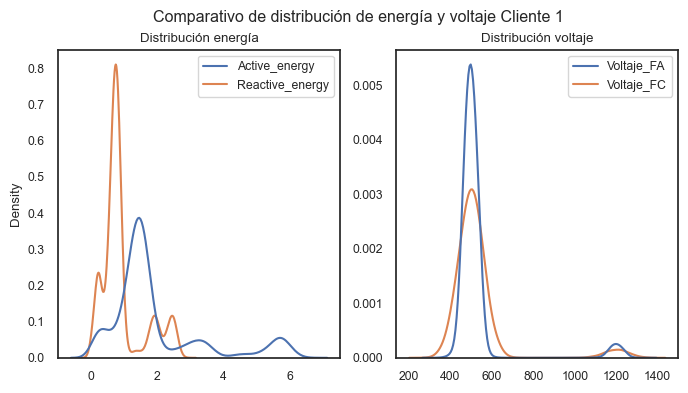

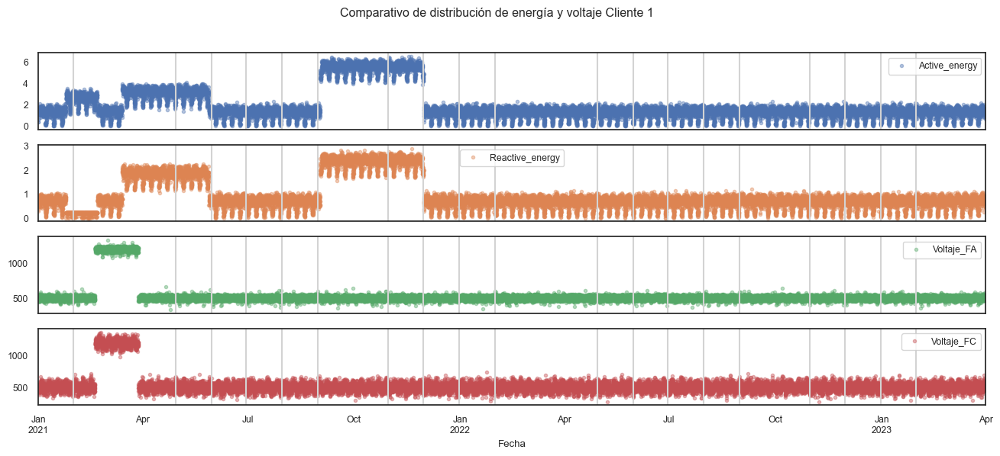

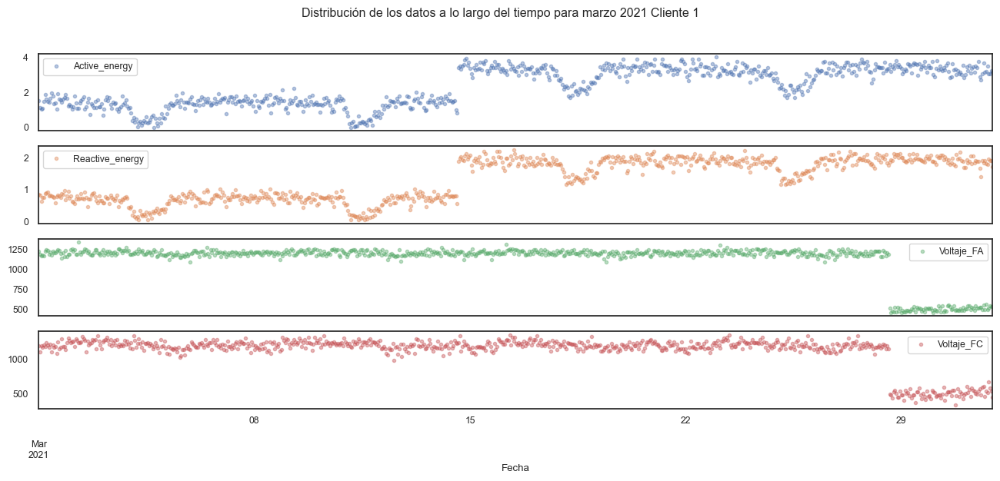

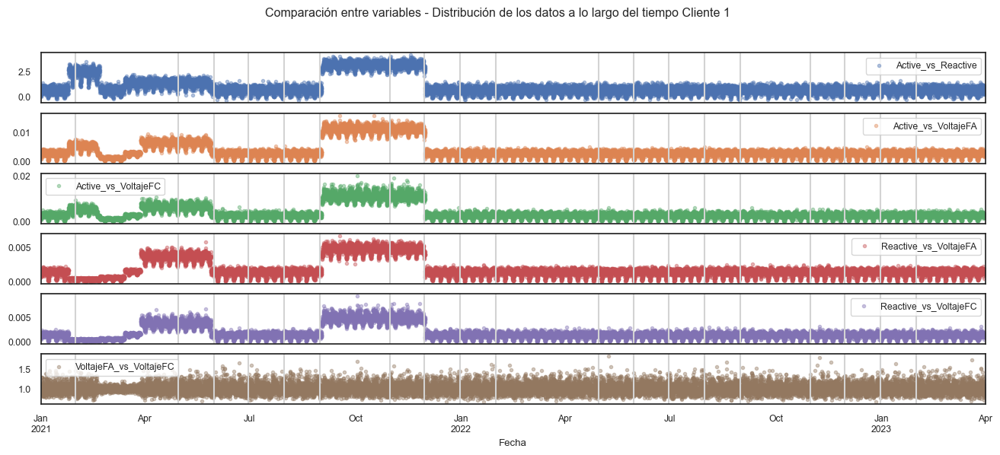

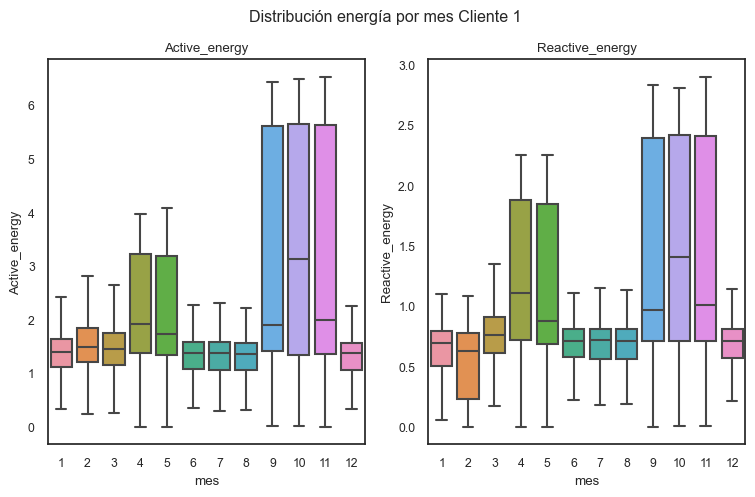

...

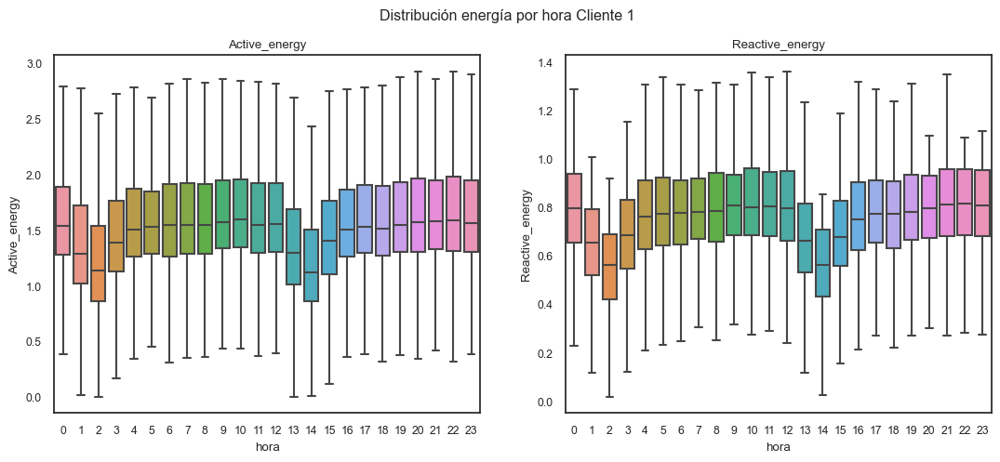

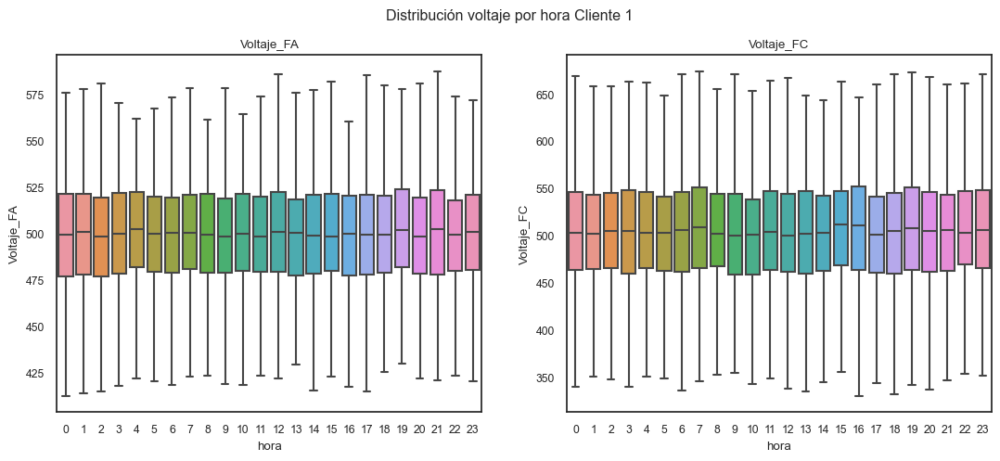

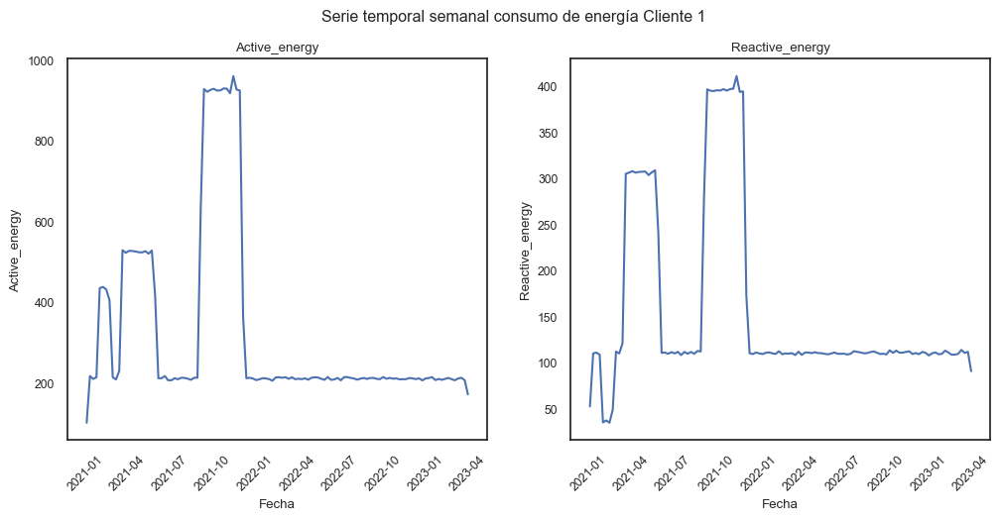

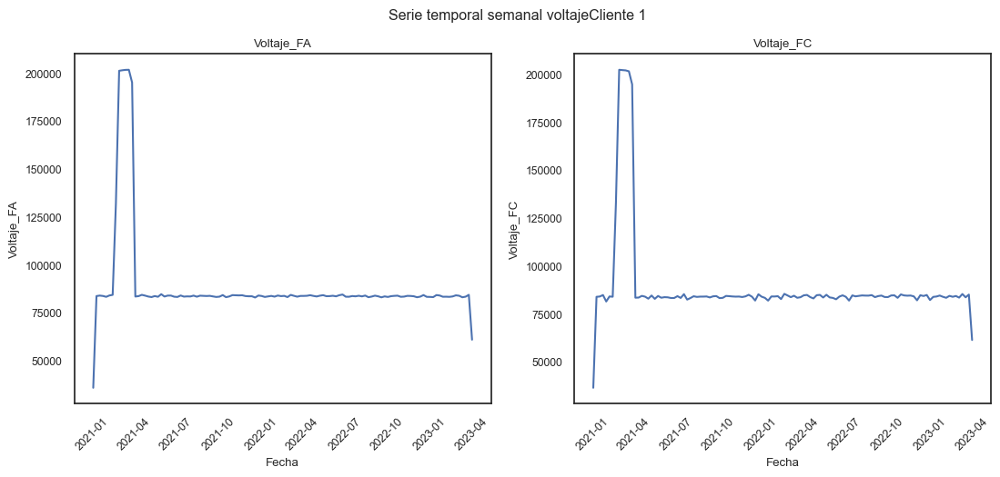

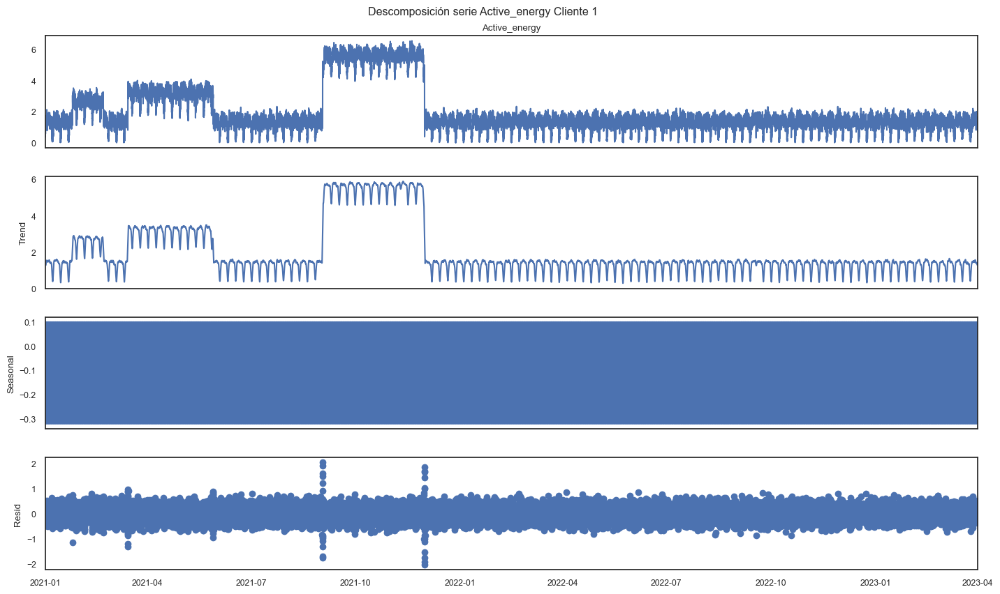

Descomposición serie Reactive_energy


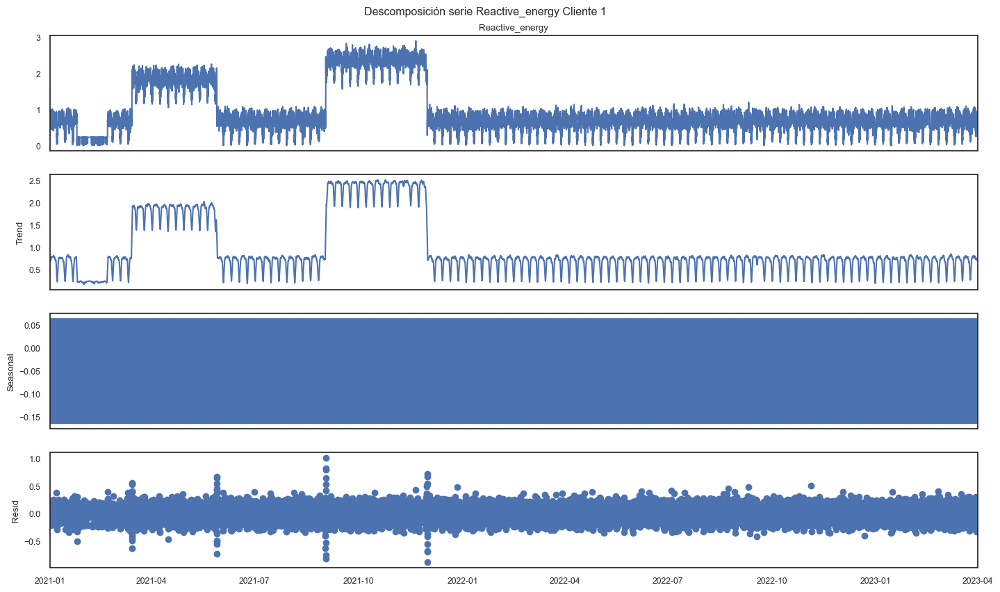

Descomposición serie Voltaje_FA


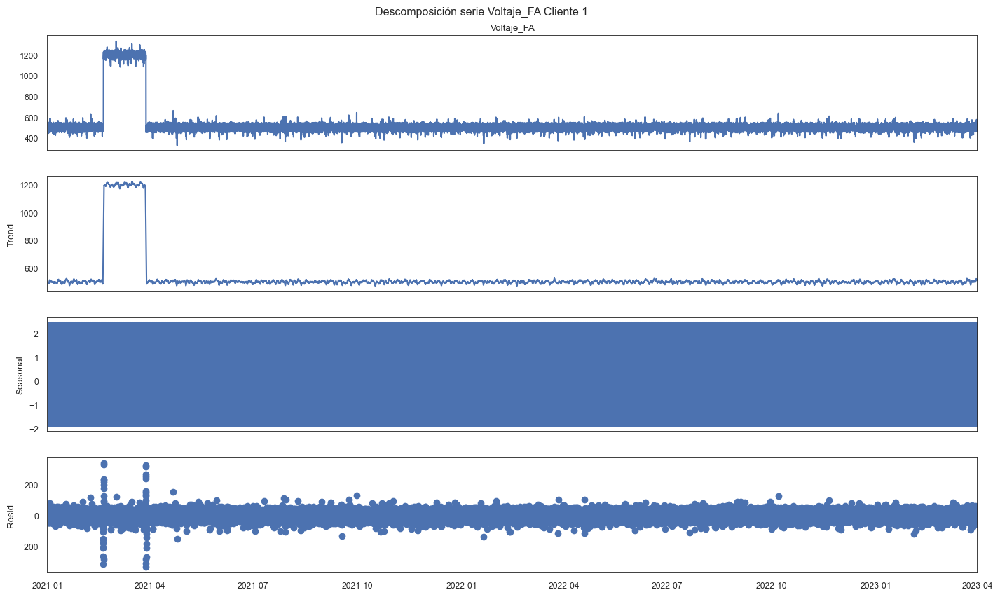

Descomposición serie Voltaje_FC


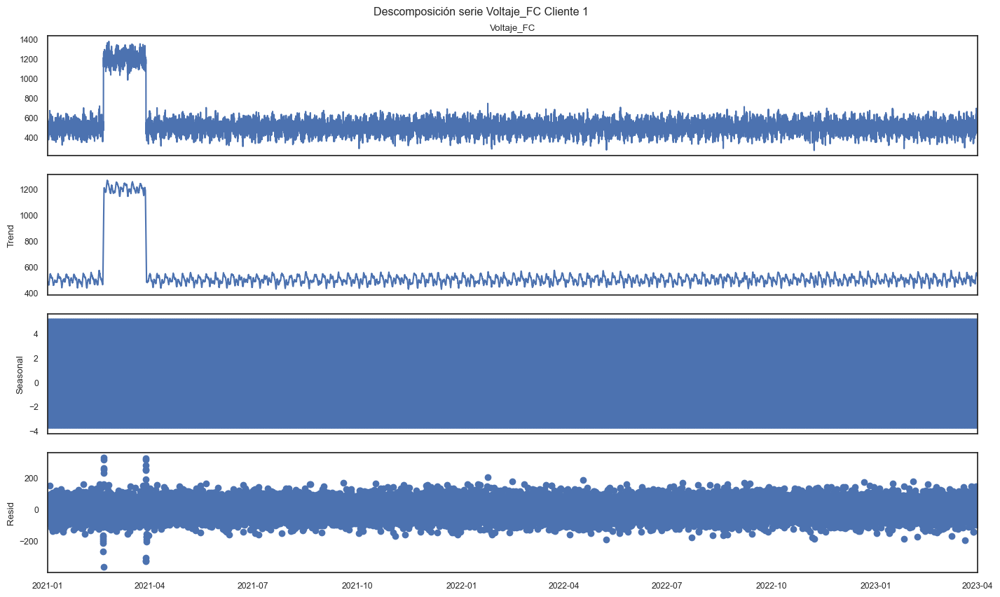

In [69]:
cliente = "Cliente 1"
df_cliente = merged_df[merged_df["Cliente"] == cliente].copy()
analisis_detallado(df_cliente, desc=f"{cliente}")